# Overview:

### Task:

**Create classificators and compare:**

- classical features + knn/svm/linear classificator
- CNN+MLP with your own architecture
- Finetuned CNN

Dataset: https://drive.google.com/file/d/1VSIMAR3-2fXTEy-QdY2d0M_-aC1aXfWp/view

# Import of libraries:

In [43]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

import cv2
from skimage.feature import hog

from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score

In [2]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D, Dropout, BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_hub as hub

In [3]:
%matplotlib inline
plt.style.use('ggplot')
params = {'axes.titlesize': 16,
          'legend.fontsize': 14,
          'figure.figsize': (14, 7),
          'axes.labelsize': 14,
          'axes.titlesize': 14,
          'xtick.labelsize': 14,
          'ytick.labelsize': 14,
          'figure.titlesize': 16}
plt.rcParams.update(params)

In [4]:
seed_value = 0
# 1. Set `PYTHONHASHSEED` environment variable at a fixed value
import os
os.environ['PYTHONHASHSEED']=str(seed_value)

# 2. Set `python` built-in pseudo-random generator at a fixed value
import random
random.seed(seed_value)

# 3. Set `numpy` pseudo-random generator at a fixed value
np.random.seed(seed_value)

# 4. Set the `tensorflow` pseudo-random generator at a fixed value
tf.random.set_seed(seed_value)
# for later versions: 
# tf.compat.v1.set_random_seed(seed_value)

# 5. Configure a new global `tensorflow` session
from tensorflow.keras import backend as K
session_conf = tf.compat.v1.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
sess = tf.compat.v1.Session(graph=tf.compat.v1.get_default_graph(), config=session_conf)
tf.compat.v1.keras.backend.set_session(sess)

# Data Loading:

In [8]:
base_dir = os.path.join(os.path.dirname('./'), 'data')
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'test')

In [9]:
train_buildings_dir = os.path.join(train_dir, 'buildings')  # directory with our training buildings pictures
train_forest_dir = os.path.join(train_dir, 'forest')  # directory with our training forest pictures
train_glacier_dir = os.path.join(train_dir, 'glacier')  # directory with our training glacier pictures
train_mountain_dir = os.path.join(train_dir, 'mountain')  # directory with our training mountain pictures
train_sea_dir = os.path.join(train_dir, 'sea')  # directory with our training sea pictures
train_street_dir = os.path.join(train_dir, 'street')  # directory with our training street pictures

validation_buildings_dir = os.path.join(validation_dir, 'buildings')  # directory with our validation buildings pictures
validation_forest_dir = os.path.join(validation_dir, 'forest')  # directory with our validation forest pictures
validation_glacier_dir = os.path.join(validation_dir, 'glacier')  # directory with our validation glacier pictures
validation_mountain_dir = os.path.join(validation_dir, 'mountain')  # directory with our validation mountain pictures
validation_sea_dir = os.path.join(validation_dir, 'sea')  # directory with our validation sea pictures
validation_street_dir = os.path.join(validation_dir, 'street')  # directory with our validation street pictures

In [10]:
num_buildings_tr = len(os.listdir(train_buildings_dir))
num_forest_tr = len(os.listdir(train_forest_dir))
num_glacier_tr = len(os.listdir(train_glacier_dir))
num_mountain_tr = len(os.listdir(train_mountain_dir))
num_sea_tr = len(os.listdir(train_sea_dir))
num_street_tr = len(os.listdir(train_street_dir))

num_buildings_val = len(os.listdir(validation_buildings_dir))
num_forest_val = len(os.listdir(validation_forest_dir))
num_glacier_val = len(os.listdir(validation_glacier_dir))
num_mountain_val = len(os.listdir(validation_mountain_dir))
num_sea_val = len(os.listdir(validation_sea_dir))
num_street_val = len(os.listdir(validation_street_dir))

total_train = num_buildings_tr + num_forest_tr + num_glacier_tr + num_mountain_tr + num_sea_tr + num_street_tr
total_val = num_buildings_val + num_forest_val + num_glacier_val + num_mountain_val + num_sea_val + num_street_val + num_street_val

In [11]:
print('total training buildings images:', num_buildings_tr)
print('total training forest images:', num_forest_tr)
print('total training glacier images:', num_glacier_tr)
print('total training mountain images:', num_mountain_tr)
print('total training sea images:', num_sea_tr)
print('total training street images:', num_street_tr)
print()
print('total validation buildings images:', num_buildings_val)
print('total validation forest images:', num_forest_val)
print('total validation glacier images:', num_glacier_val)
print('total validation mountain images:', num_mountain_val)
print('total validation sea images:', num_sea_val)
print('total validation street images:', num_street_val)


print("--")
print("Total training images:", total_train)
print("Total validation images:", total_val)

total training buildings images: 2191
total training forest images: 2271
total training glacier images: 2404
total training mountain images: 2512
total training sea images: 2274
total training street images: 2382

total validation buildings images: 437
total validation forest images: 474
total validation glacier images: 553
total validation mountain images: 525
total validation sea images: 510
total validation street images: 501
--
Total training images: 14034
Total validation images: 3501


In [12]:
image_gen_train = ImageDataGenerator(rescale=1./255)
train_data_gen = image_gen_train.flow_from_directory(
    batch_size=1,
    directory=train_dir,
    shuffle=False,
    target_size=(150, 150)
    )

Found 14034 images belonging to 6 classes.


In [13]:
image_gen_val = ImageDataGenerator(rescale=1./255)

val_data_gen = image_gen_val.flow_from_directory(
    batch_size=1,
    directory=validation_dir,
    target_size=(150, 150),
    shuffle=False,
    )

Found 3000 images belonging to 6 classes.


In [14]:
class_names = np.asarray(list(val_data_gen.class_indices.keys()))
print(class_names)

['buildings' 'forest' 'glacier' 'mountain' 'sea' 'street']


In [15]:
X_train = []
for i in range(train_data_gen.samples):
    X_train.append(train_data_gen[i][0][0])
X_train = np.asarray(X_train)
y_train = train_data_gen.classes

In [16]:
X_valid = []
for i in range(val_data_gen.samples):
    X_valid.append(val_data_gen[i][0][0])
X_valid = np.asarray(X_valid)
y_valid = val_data_gen.classes

In [17]:
print('X_train shape =', X_train.shape)
print('y_train shape =', y_train.shape)

print('X_valid shape =', X_valid.shape)
print('y_valid shape =', y_valid.shape)

X_train shape = (14034, 150, 150, 3)
y_train shape = (14034,)
X_valid shape = (3000, 150, 150, 3)
y_valid shape = (3000,)


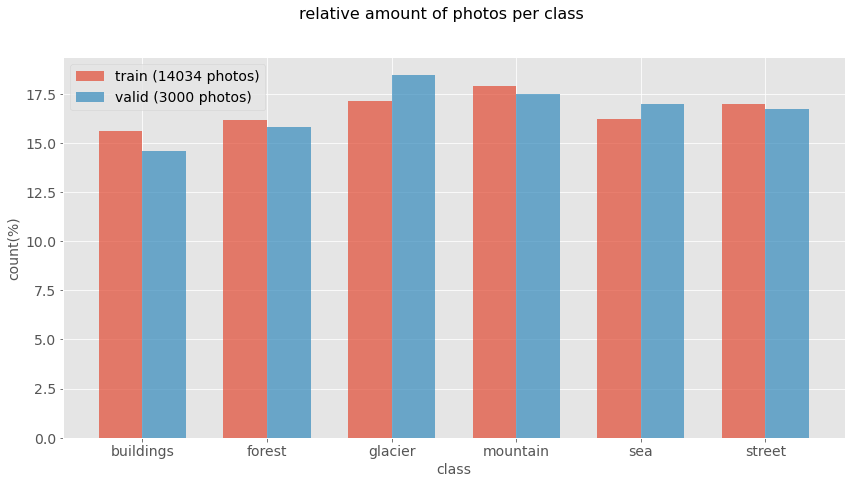

In [18]:
def plot_bar(y, loc='left'):
    width = 0.35
    # calculate counts per type and sort, to ensure their order
    unique, counts = np.unique(y, return_counts=True)
    sorted_index = np.argsort(unique)
    unique = unique[sorted_index]
    # plot as a percentage
    counts = 100*counts[sorted_index]/len(y)
    ylabel_text = 'count(%)'
    xtemp = np.arange(len(unique))
    plt.bar(xtemp + n*width, counts, align='center', alpha=.7, width=width)
    plt.xticks(xtemp, list(val_data_gen.class_indices.keys()))
    plt.xlabel('class')
    plt.ylabel(ylabel_text)
 
plt.suptitle('relative amount of photos per class')
n = -0.5
plot_bar(y_train)
n = 0.5
plot_bar(y_valid)
plt.legend([
    f'train ({len(y_train)} photos)',
    f'valid ({len(y_valid)} photos)'
]);

**As we can see the dataset has 6 classes:**

- buildings
- forest
- glacier
- mountain
- sea
- street

**The dataset is a bit imbalanced, but I think I can ignore it because it should not have a big impact.**

In [19]:
def plot_confusion_matrix(title, y_true, y_pred, columns, figsize=(7,5)):
    """
    It plots the confusion matrix, shows how many of true labels were predicted correctly, their percentage.
    
    param title: the text of the title;
    param y_true: true labels;
    param y_pred: predicted labels;
    param columns: labels(unique);
    param figsize: the size of the plot.
    """
    cm = confusion_matrix(y_true, y_pred, labels=np.unique(y_true))
    cm_sum = np.sum(cm, axis=1, keepdims=True)
    cm_perc = cm / cm_sum.astype(float) * 100
    annot = np.empty_like(cm).astype(str)
    nrows, ncols = cm.shape
    for i in range(nrows):
        for j in range(ncols):
            c = cm[i, j]
            p = cm_perc[i, j]
            if i == j:
                s = cm_sum[i]
                annot[i, j] = '%.1f%%\n%d/%d' % (p, c, s)
            elif c == 0:
                annot[i, j] = ''
            else:
                annot[i, j] = '%.1f%%\n%d' % (p, c)
    cm = pd.DataFrame(cm, index=columns, columns=columns)
    cm.index.name = 'Actual'
    cm.columns.name = 'Predicted'
    fig, ax = plt.subplots(figsize=figsize)
    plt.title(title)
    sns.heatmap(cm, cmap= "YlGnBu", annot=annot, fmt='', ax=ax)
    plt.show()

In [20]:
def plot_images(images_arr, labels):
    """
    It shows the table of images with its labels.
    
    param images_arr: the array of images;
    param labels: the array of labels of images.

    """
    fig, axes = plt.subplots(3, 5, figsize=(20,15))
    axes = axes.flatten()
    labels = class_names[labels]
    for img, label, ax in zip(images_arr, labels, axes):
        ax.imshow(img)
        ax.grid(False)
        ax.set_title(f'Lable: {label}')

        
    plt.tight_layout()
    plt.show()

## Looking at the data:

**Some examples of images of both train and validation datasets.**

### Train dataset:

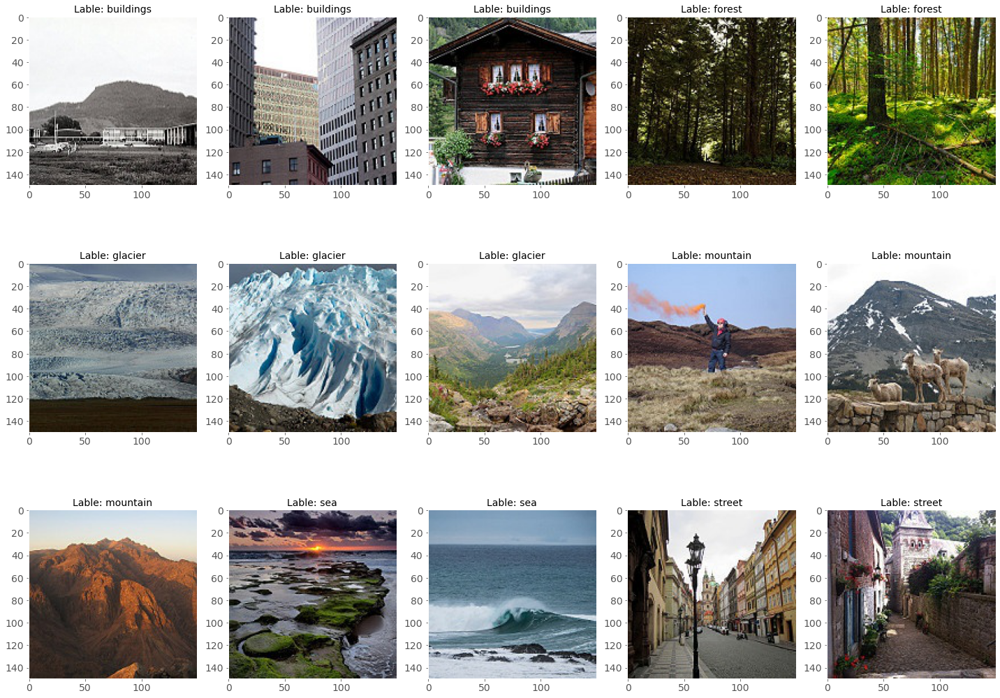

In [21]:
plot_images(X_train[0:len(X_train):len(X_train)//15], y_train[0:len(y_train):len(y_train)//15])

### Validation dataset:

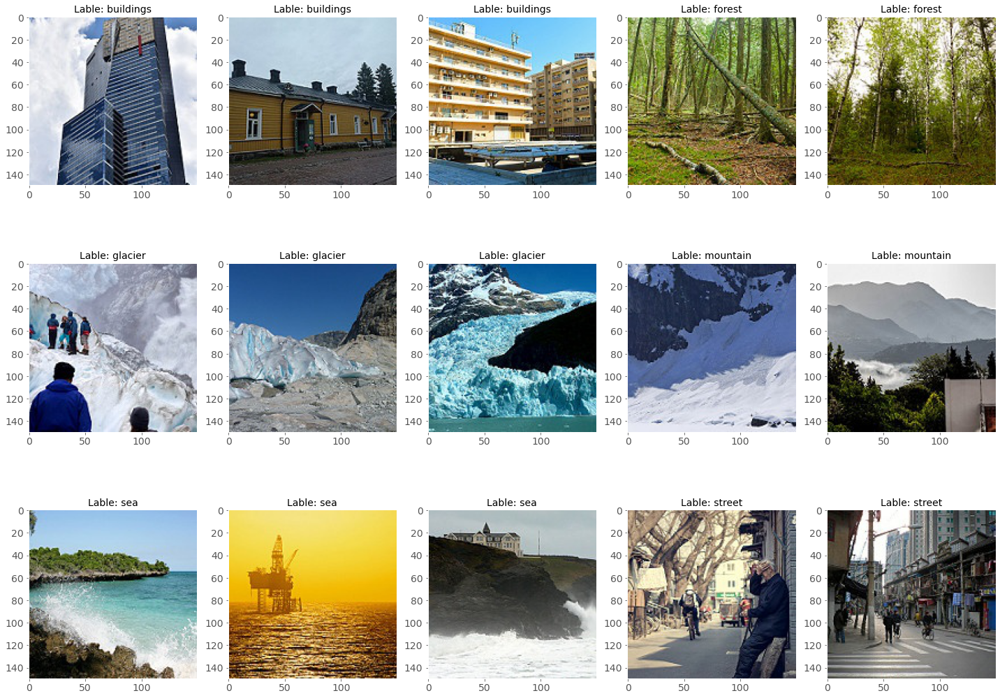

In [22]:
plot_images(X_valid[0:len(X_valid):len(X_valid)//15], y_valid[0:len(y_valid):len(y_valid)//15])

**At the very begining we can see that some classes are similar to each other: street and buildings; mountains and glaciers. Morever, some pictures have building, streets, mountainc, etc at the same time.**

# Classical ML:

**To create features I am going to use 2 aproaches:**

- extract a 3D color histogram from the HSV color space;
- calculate The histogram of oriented gradients (HOG).

In [23]:
def extract_color_histogram(image, bins=(8, 8, 8)):
    '''
    it extracts a 3D color histogram from the HSV color space using the supplied number of `bins` per channel
    '''
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hist = cv2.calcHist(
        [hsv], 
        [0, 1, 2], 
        None, 
        bins,
        [0, 180, 0, 256, 0, 256])
    
    cv2.normalize(hist, hist)
    # return the flattened histogram as the feature vector
    return hist.flatten()

In [24]:
def get_img_hog(img):
    '''
    It calculates the histogram of oriented gradients of the given image.
    '''
    _, hog_img = hog(
    image=img,
    pixels_per_cell=(12, 12),
    cells_per_block=(2,2),
    orientations=8,
    visualize=True,
    block_norm='L2-Hys')
    return np.asarray(hog_img)
    

In [25]:
%%time
X_valid_hist = np.asarray([extract_color_histogram(X_valid[i]) for i in range(len(X_valid))])
X_valid_hog = np.asarray([get_img_hog(X_valid[i]) for i in range(len(X_valid))])

Wall time: 2min 28s


In [26]:
X_valid_hist.shape, X_valid_hog.shape

((3000, 512), (3000, 150, 150))

In [27]:
%%time
X_train_hist = np.asarray([extract_color_histogram(X_train[i]) for i in range(len(X_train))])
X_train_hog = np.asarray([get_img_hog(X_train[i]) for i in range(len(X_train))])

Wall time: 12min 23s


In [28]:
X_train_hist.shape, X_train_hog.shape

((14034, 512), (14034, 150, 150))

In [29]:
# To clean the memory:
del X_train 
del X_valid

**To show what the HOG is I will visualize it. The same samples of images but after calculating HOG:**

### Train dataset(HOG):

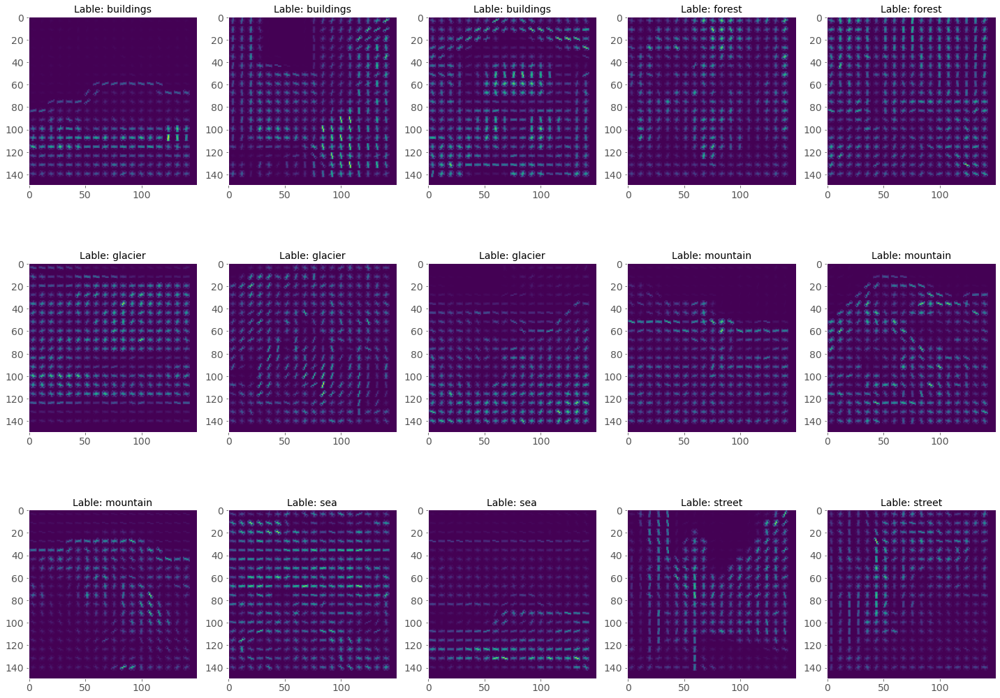

In [30]:
plot_images(X_train_hog[0:len(X_train_hog):len(X_train_hog)//15], y_train[0:len(y_train):len(y_train)//15])

### Validation dataset:

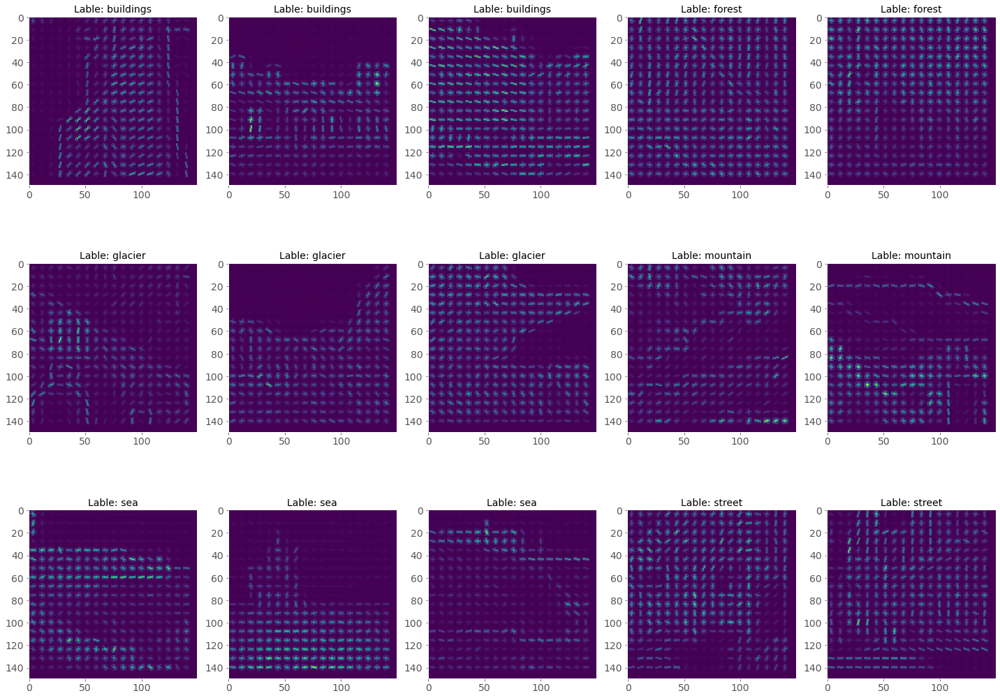

In [31]:
plot_images(X_valid_hog[0:len(X_valid_hog):len(X_valid_hog)//15], y_valid[0:len(y_valid):len(y_valid)//15])

**Now I will flatten them into 1d vectors.**

In [32]:
X_valid_hog = np.asarray([X_valid_hog[i].flatten() for i in range(len(X_valid_hog))])

In [33]:
X_train_hog = np.asarray([X_train_hog[i].flatten() for i in range(len(X_train_hog))])

## KNN:

In [34]:
knn_classifier = KNeighborsClassifier(n_neighbors=6, n_jobs= -1, algorithm='kd_tree', weights='distance')

### 3D color histogram from the HSV color space:

In [35]:
knn_classifier.fit(X_train_hist, y_train) 
predictions = knn_classifier.predict(X_valid_hist)

accuracy = 38.9%


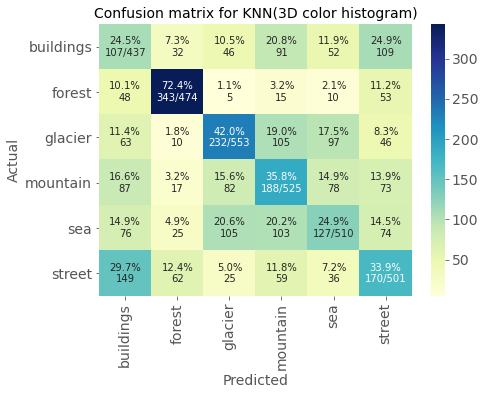

              precision    recall  f1-score   support

   buildings       0.20      0.24      0.22       437
      forest       0.70      0.72      0.71       474
     glacier       0.47      0.42      0.44       553
    mountain       0.34      0.36      0.35       525
         sea       0.32      0.25      0.28       510
      street       0.32      0.34      0.33       501

    accuracy                           0.39      3000
   macro avg       0.39      0.39      0.39      3000
weighted avg       0.39      0.39      0.39      3000



In [38]:
print(f'accuracy = {np.round(accuracy_score(y_valid, predictions),4)*100}%')
plot_confusion_matrix('Confusion matrix for KNN(3D color histogram)', y_valid, predictions, class_names)
print(classification_report(y_valid, predictions, target_names=list(val_data_gen.class_indices.keys())))

### HOG:

In [39]:
%%time
knn_classifier.fit(X_train_hog, y_train) 
predictions = knn_classifier.predict(X_valid_hog)

Wall time: 7min 20s


accuracy = 45.03%


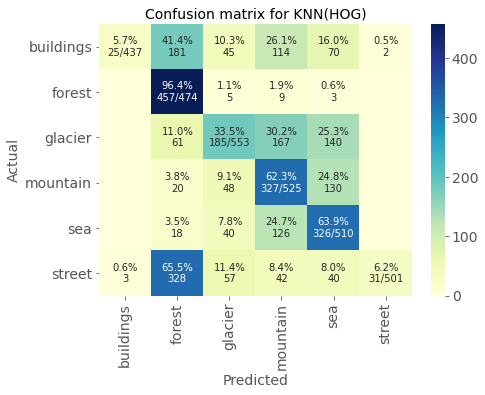

              precision    recall  f1-score   support

   buildings       0.89      0.06      0.11       437
      forest       0.43      0.96      0.59       474
     glacier       0.49      0.33      0.40       553
    mountain       0.42      0.62      0.50       525
         sea       0.46      0.64      0.53       510
      street       0.94      0.06      0.12       501

    accuracy                           0.45      3000
   macro avg       0.60      0.45      0.37      3000
weighted avg       0.60      0.45      0.38      3000



In [40]:
print(f'accuracy = {np.round(accuracy_score(y_valid, predictions),4)*100}%')
plot_confusion_matrix('Confusion matrix for KNN(HOG)', y_valid, predictions, class_names)
print(classification_report(y_valid, predictions, target_names=list(val_data_gen.class_indices.keys())))

**The accuracy of predictions by KNN are very poor: 38.9% and 45%.**

# SGD:

### 3D color histogram from the HSV color space:

In [44]:
%%time
sgd_clf = SGDClassifier(random_state=42, max_iter=1000, tol=1e-3)
sgd_clf.fit(X_train_hist, y_train)
predictions = sgd_clf.predict(X_valid_hist)

Wall time: 1.61 s


accuracy = 32.129999999999995%


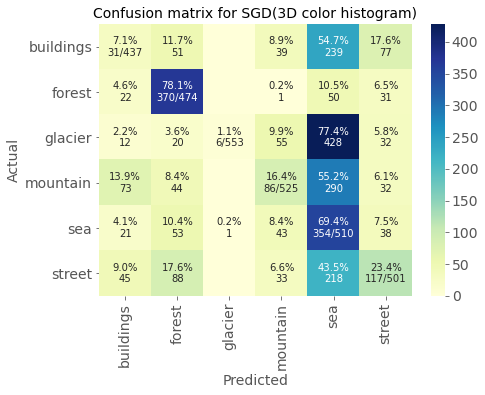

              precision    recall  f1-score   support

   buildings       0.15      0.07      0.10       437
      forest       0.59      0.78      0.67       474
     glacier       0.86      0.01      0.02       553
    mountain       0.33      0.16      0.22       525
         sea       0.22      0.69      0.34       510
      street       0.36      0.23      0.28       501

    accuracy                           0.32      3000
   macro avg       0.42      0.33      0.27      3000
weighted avg       0.43      0.32      0.27      3000



In [46]:
print(f'accuracy = {np.round(accuracy_score(y_valid, predictions),4)*100}%')
plot_confusion_matrix('Confusion matrix for SGD(3D color histogram)', y_valid, predictions, class_names)
print(classification_report(y_valid, predictions, target_names=list(val_data_gen.class_indices.keys())))

### HOG:

In [48]:
%%time
sgd_clf.fit(X_train_hog, y_train)
predictions = sgd_clf.predict(X_valid_hog)

Wall time: 2min 21s


accuracy = 65.47%


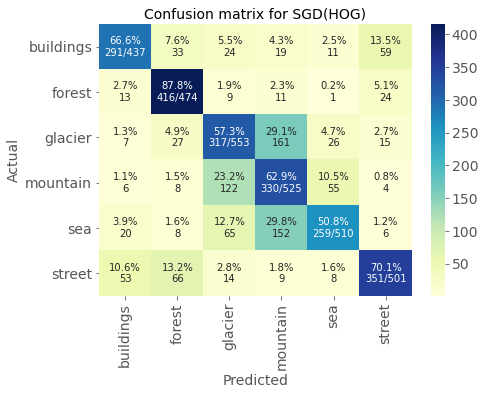

              precision    recall  f1-score   support

   buildings       0.75      0.67      0.70       437
      forest       0.75      0.88      0.81       474
     glacier       0.58      0.57      0.57       553
    mountain       0.48      0.63      0.55       525
         sea       0.72      0.51      0.60       510
      street       0.76      0.70      0.73       501

    accuracy                           0.65      3000
   macro avg       0.67      0.66      0.66      3000
weighted avg       0.67      0.65      0.65      3000



In [49]:
print(f'accuracy = {np.round(accuracy_score(y_valid, predictions),4)*100}%')
plot_confusion_matrix('Confusion matrix for SGD(HOG)', y_valid, predictions, class_names)
print(classification_report(y_valid, predictions, target_names=list(val_data_gen.class_indices.keys())))

**SGD classifier gave much better results in case of using HOG as the feature: 65.47%**

## SVM:

### 3D color histogram from the HSV color space:

In [50]:
%%time
svm_clf = SVC()
svm_clf.fit(X_train_hist, y_train)
predictions = svm_clf.predict(X_valid_hist)

Wall time: 2min 17s


accuracy = 42.0%


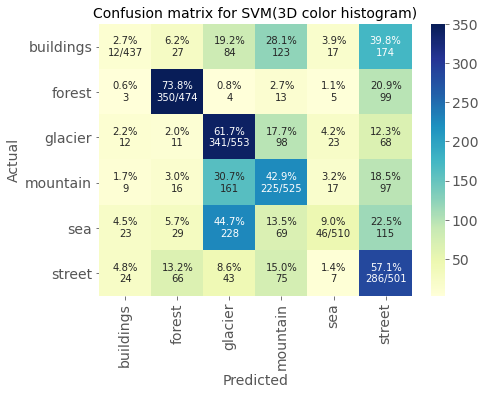

              precision    recall  f1-score   support

   buildings       0.14      0.03      0.05       437
      forest       0.70      0.74      0.72       474
     glacier       0.40      0.62      0.48       553
    mountain       0.37      0.43      0.40       525
         sea       0.40      0.09      0.15       510
      street       0.34      0.57      0.43       501

    accuracy                           0.42      3000
   macro avg       0.39      0.41      0.37      3000
weighted avg       0.40      0.42      0.38      3000



In [51]:
print(f'accuracy = {np.round(accuracy_score(y_valid, predictions),4)*100}%')
plot_confusion_matrix('Confusion matrix for SVM(3D color histogram)', y_valid, predictions, class_names)
print(classification_report(y_valid, predictions, target_names=list(val_data_gen.class_indices.keys())))

### HOG:

In [52]:
%%time
svm_clf = SVC()
svm_clf.fit(X_train_hog, y_train)
predictions = svm_clf.predict(X_valid_hog)

Wall time: 1h 6min 57s


accuracy = 72.07000000000001%


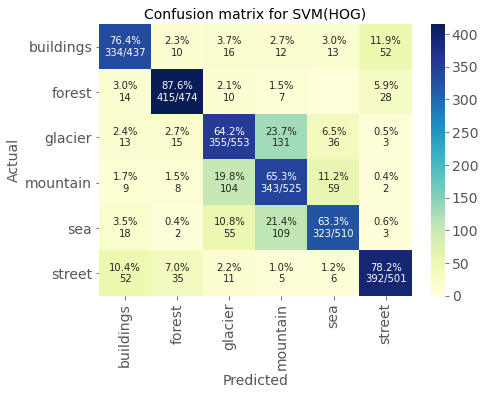

              precision    recall  f1-score   support

   buildings       0.76      0.76      0.76       437
      forest       0.86      0.88      0.87       474
     glacier       0.64      0.64      0.64       553
    mountain       0.57      0.65      0.61       525
         sea       0.74      0.63      0.68       510
      street       0.82      0.78      0.80       501

    accuracy                           0.72      3000
   macro avg       0.73      0.73      0.73      3000
weighted avg       0.73      0.72      0.72      3000



In [53]:
print(f'accuracy = {np.round(accuracy_score(y_valid, predictions),4)*100}%')
plot_confusion_matrix('Confusion matrix for SVM(HOG)', y_valid, predictions, class_names)
print(classification_report(y_valid, predictions, target_names=list(val_data_gen.class_indices.keys())))

**And at this momemt the winner is SVM: Accuracy = 72%.**

In [68]:
# To clean the memory:
del X_train_hog
del X_train_hist
del X_valid_hog
del X_valid_hist

## CLonclusion:

- HOG is better aproach of getting features;
- KNN is very bad choice as image classifier;
- Grid search and random search are supposed to be useful here, but it takes too much memory and time.
- SVM and SGD gave good results, but I think their limit is no more than 80%.

# CNN:

## Own architecture:

In [54]:
BATCH_SIZE = 64
IMG_SHAPE  = 150 
EPOCHS = 50

In [55]:
def plotImages(images_arr):
    '''
    It plots images: 5 in a row.
    '''
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
        ax.grid(False)
        
    plt.tight_layout()
    plt.show()

In [56]:
def define_model():
    model = Sequential([
                        Conv2D(32, (3,3), activation='relu', input_shape=(IMG_SHAPE, IMG_SHAPE, 3)),
                        MaxPooling2D(2, 2),
                        Dropout(0.2),
                        Conv2D(64, (3,3), activation='relu'),
                        MaxPooling2D(2,2),
                        Dropout(0.2),
                        Conv2D(128, (3,3), activation='relu'),
                        MaxPooling2D(2,2),
                        Dropout(0.2),
                        Conv2D(128, (3,3), activation='relu'),
                        MaxPooling2D(2,2),
                        Dropout(0.2),
                        Flatten(),
                        Dense(256, activation='relu'),
                        Dropout(0.5),
                        Dense(6, activation='softmax')
                        ])
    model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])    
    return model

In [57]:
def plot_history(history):
    '''
    It plots the learning curves for train and validation datasets. For loss and accuracy.
    '''
    print('Learning curves:')
    metrics = list(history.history.keys())
    
    loss = history.history[f'{metrics[0]}']
    acc = history.history[f'{metrics[1]}']

    val_loss = history.history[f'{metrics[2]}']
    val_acc = history.history[f'{metrics[3]}']

    x = range(1, len(acc) + 1)

    plt.subplot(1, 2, 1)
    plt.plot(x, loss, 'b', label='Training loss')
    plt.plot(x, val_loss, 'r', label='Validation loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.title('Training and validation loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(x, acc, 'b', label='Training acc')
    plt.plot(x, val_acc, 'r', label='Validation acc')
    plt.xlabel('epochs')
    plt.ylabel('acc')
    plt.title('Training and validation accuracy')
    plt.legend()

In [197]:
def plot_image(i, plot_data, pred_best=True, num_img=10):
    '''
    It plots an image, its true label, predicted label and probability of predicted label.
    '''
    if pred_best:
        plot_data = plot_data[-num_img:]
    else:
        plot_data = plot_data[:num_img]       
    true_label, predicted_label, predecited_prob_max, img = plot_data[i][0], plot_data[i][1], plot_data[i][4], plot_data[i][3]
    
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(plt.imread(img))
    
    if plot_data[i][1] == plot_data[i][0]:
        color = 'b'
    else:
        color = 'r'

    plt.xlabel(f"{class_names[predicted_label]} {np.round(predecited_prob_max*100, 2)}% ({class_names[true_label]})",
                                color=color)

def plot_value_array(i, plot_data, pred_best=True, num_img=10):
    '''
        It plots the chart of predicted probs(for all classes) for an image.
    '''
    if pred_best:
        plot_data = plot_data[-num_img:]
    else:
        plot_data = plot_data[:num_img]  
    true_label, predicted_label, predecited_prob = plot_data[i][0], plot_data[i][1], plot_data[i][2]

    plt.grid(True)
    thisplot = plt.bar(range(6), predecited_prob, color="#777777")
    plt.ylim([0, 1])
    thisplot[predicted_label].set_color('red')
    thisplot[true_label].set_color('blue')
    _ = plt.xticks(range(6), class_names, rotation=45)
    
def show_top_images(model, data_generator):  
    '''
    It uses the model to predict the lables for given dataset(train or validation and sorts probs of predictions.
    '''
    y_pred_proba = model.predict(data_generator)
    y_pred_proba = np.asarray(tf.squeeze(y_pred_proba))
    y_pred_labels = tf.argmax(y_pred_proba, axis=1)    
    y_pred_proba_max = np.max(y_pred_proba, axis=1)
    y_true_labels = class_names[y_valid]
    y_predicted_labels = class_names[y_pred_labels]

    filepaths = data_generator.filepaths

    top_data = list(zip(y_valid, y_pred_labels, y_pred_proba, filepaths, y_pred_proba_max))
    top_data = sorted(top_data, key=lambda prob_max: prob_max[4])
    return top_data

### Without augmentation:

In [58]:
image_gen_train = ImageDataGenerator(rescale=1./255)

train_data_gen = image_gen_train.flow_from_directory(
    batch_size=BATCH_SIZE,
    directory=train_dir,
    shuffle=True,
    target_size=(IMG_SHAPE,IMG_SHAPE)
    )

Found 14034 images belonging to 6 classes.


In [60]:
image_gen_val = ImageDataGenerator(rescale=1./255)

val_data_gen = image_gen_val.flow_from_directory(
    batch_size=BATCH_SIZE,
    directory=validation_dir,
    shuffle=False,    
    target_size=(IMG_SHAPE, IMG_SHAPE)
    )

Found 3000 images belonging to 6 classes.


In [62]:
model = define_model()
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 74, 74, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 34, 34, 128)       7

In [63]:
model_path = './model/weights_own_arch_base.hdf5'
callbacks=[
        EarlyStopping(
            monitor='val_loss', 
            patience=4),
              
        ModelCheckpoint(
            model_path,
            monitor='val_loss', 
            save_best_only=True, 
            save_weights_only=True,
            mode='auto',
            verbose=0)
        ]

In [64]:
history = model.fit(
    train_data_gen,
    steps_per_epoch=len(train_data_gen),
    epochs=EPOCHS,
    validation_data=val_data_gen,
    validation_steps=len(val_data_gen),
    verbose = 1,
    callbacks=callbacks
)

Epoch 1/50
220/220 [==============================] - 638s 3s/step - loss: 1.4320 - accuracy: 0.4014 - val_loss: 0.9796 - val_accuracy: 0.6127
Epoch 2/50
220/220 [==============================] - 617s 3s/step - loss: 0.8938 - accuracy: 0.6548 - val_loss: 0.8088 - val_accuracy: 0.7013
Epoch 3/50
220/220 [==============================] - 593s 3s/step - loss: 0.7415 - accuracy: 0.7264 - val_loss: 0.5779 - val_accuracy: 0.7930
Epoch 4/50
220/220 [==============================] - 603s 3s/step - loss: 0.6157 - accuracy: 0.7768 - val_loss: 0.5287 - val_accuracy: 0.8130
Epoch 5/50
220/220 [==============================] - 628s 3s/step - loss: 0.5502 - accuracy: 0.8027 - val_loss: 0.5205 - val_accuracy: 0.8127
Epoch 6/50
220/220 [==============================] - 617s 3s/step - loss: 0.4805 - accuracy: 0.8304 - val_loss: 0.4433 - val_accuracy: 0.8493
Epoch 7/50
220/220 [==============================] - 601s 3s/step - loss: 0.4554 - accuracy: 0.8363 - val_loss: 0.4569 - val_accuracy: 0.8440

In [65]:
loss, acc = model.evaluate(x=val_data_gen, batch_size=len(val_data_gen), verbose=0)
print(f'Loss = {loss}')
print(f'Accarucy = {np.round((acc * 100.0), 3)}%')

Loss = 0.4047069549560547
Accarucy = 87.567%


Learning curves:


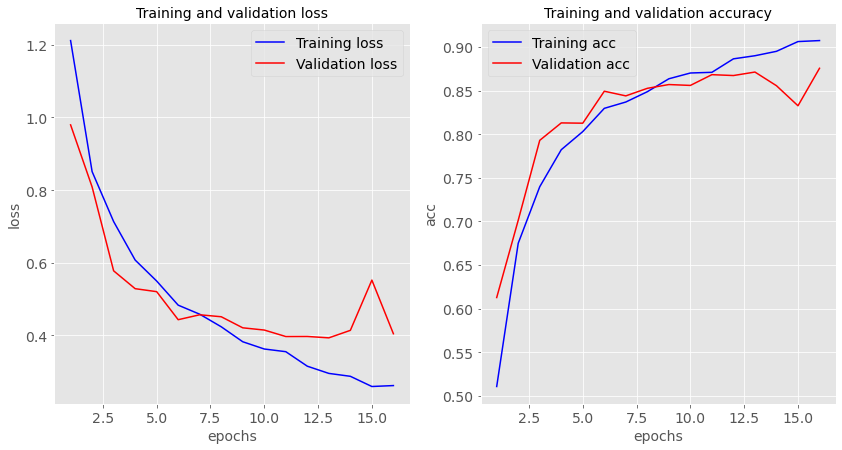

In [66]:
plot_history(history)

In [67]:
model.load_weights(model_path)

loss, acc = model.evaluate(x=val_data_gen, batch_size=len(val_data_gen), verbose=1)
print(f'Loss = {loss}')
print(f'Accarucy = {np.round((acc * 100.0), 3)}%')

47/47 [==============================] - 37s 781ms/step - loss: 0.3934 - accuracy: 0.8713
Loss = 0.39337462186813354
Accarucy = 87.133%


In [82]:
predictions = model.predict(val_data_gen)
predictions = np.argmax(predictions, axis=1)

accuracy = 87.13%


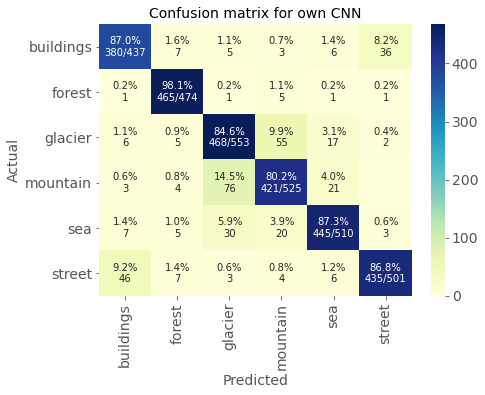

              precision    recall  f1-score   support

   buildings       0.86      0.87      0.86       437
      forest       0.94      0.98      0.96       474
     glacier       0.80      0.85      0.82       553
    mountain       0.83      0.80      0.82       525
         sea       0.90      0.87      0.88       510
      street       0.91      0.87      0.89       501

    accuracy                           0.87      3000
   macro avg       0.87      0.87      0.87      3000
weighted avg       0.87      0.87      0.87      3000



In [83]:
print(f'accuracy = {np.round(accuracy_score(y_valid, predictions),4)*100}%')
plot_confusion_matrix('Confusion matrix for own CNN', y_valid, predictions, class_names)
print(classification_report(y_valid, predictions, target_names=list(val_data_gen.class_indices.keys())))

**As we can we got very good results using CNNs. Accuracy = 87.5%**

In [170]:
plot_data = show_top_images(model, val_data_gen)

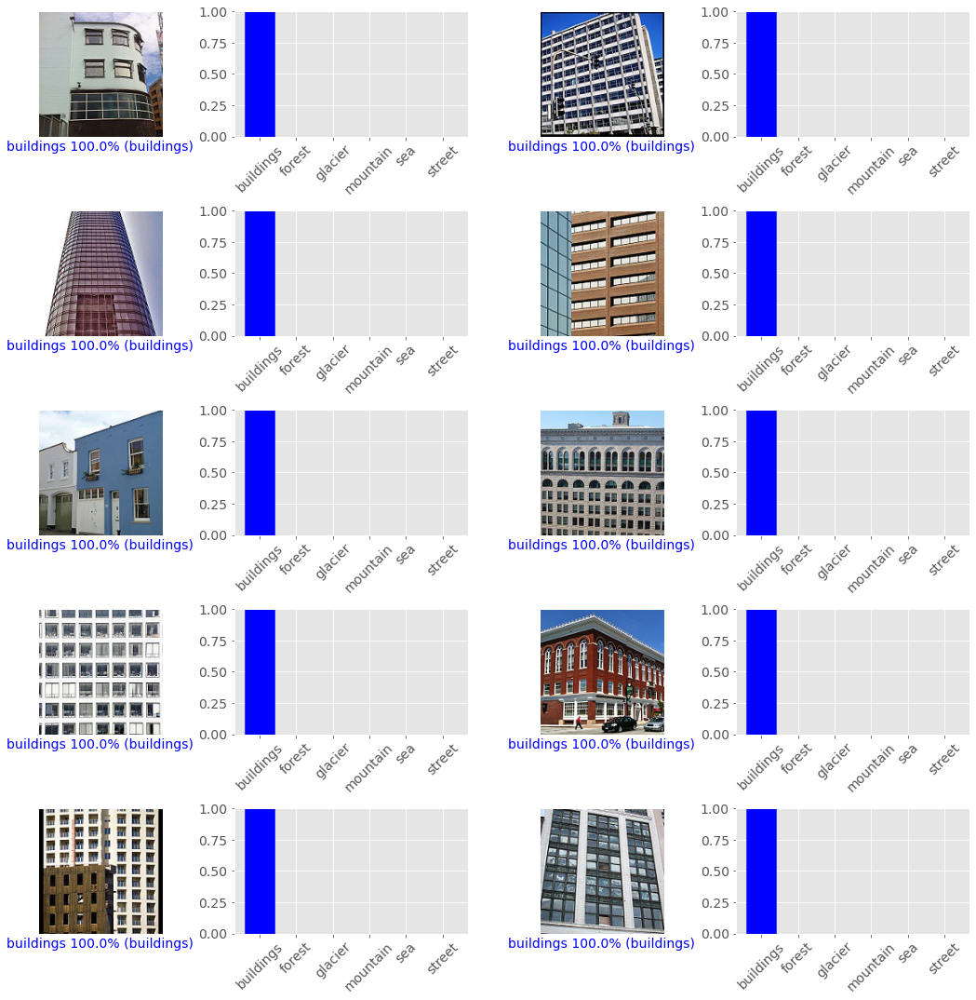

In [222]:
# Color correct predictions in blue, incorrect predictions in red
num_img=10
num_rows = num_img//2
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(15, 3*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_image(i, top_data, pred_best=True, num_img=num_img)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_value_array(i, top_data, pred_best=True, num_img=num_img)
plt.tight_layout(pad=1) 

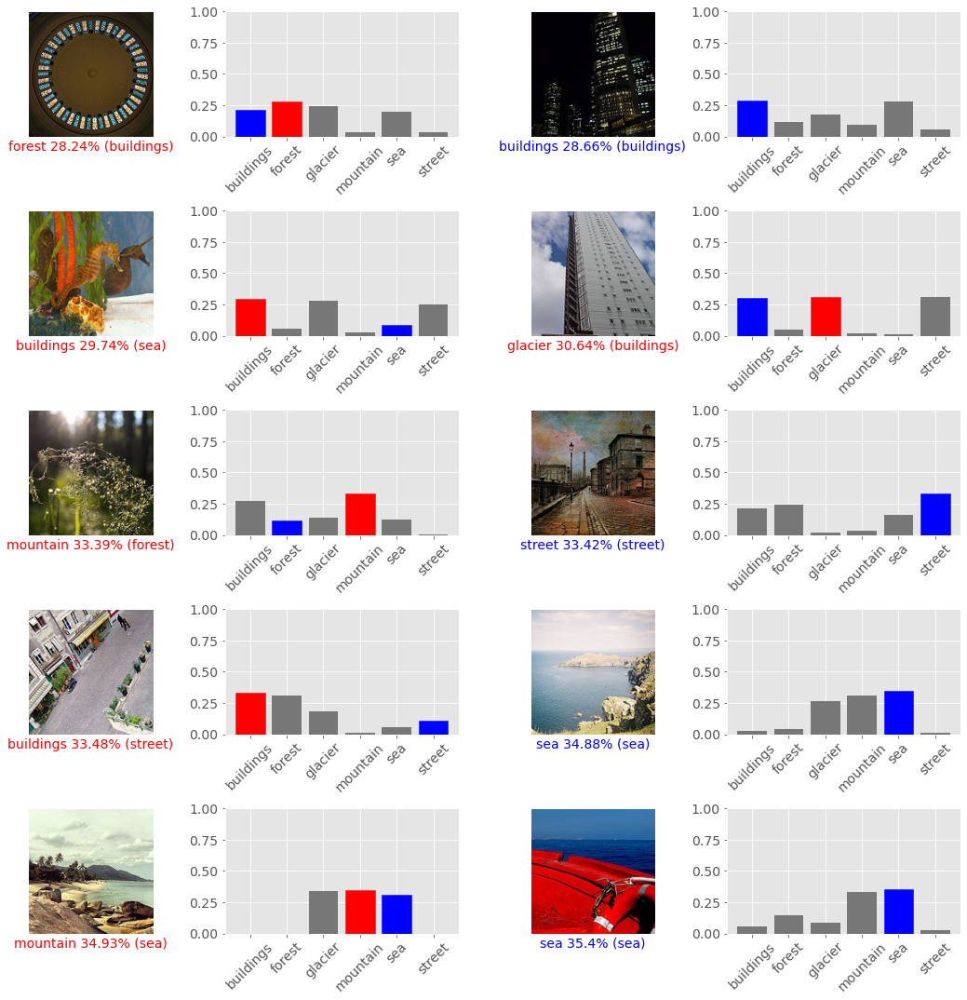

In [221]:
# Color correct predictions in blue, incorrect predictions in red
num_img=10
num_rows = num_img//2
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(15, 3*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_image(i, top_data, pred_best=False, num_img=num_img)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_value_array(i, top_data, pred_best=False, num_img=num_img)
plt.tight_layout(pad=1) 

### With augmentation:

In [223]:
image_gen_train = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
    )

train_data_gen = image_gen_train.flow_from_directory(
    batch_size=BATCH_SIZE,
    directory=train_dir,
    shuffle=True,
    target_size=(IMG_SHAPE,IMG_SHAPE)
    )

Found 14034 images belonging to 6 classes.


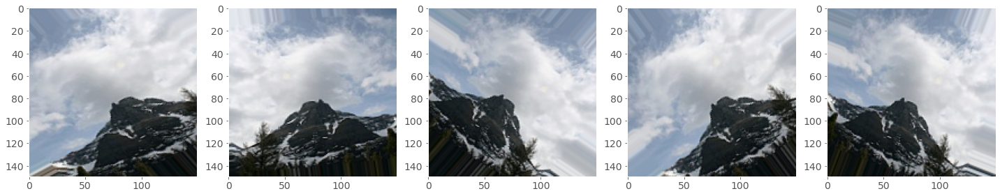

In [224]:
augmented_images = [train_data_gen[0][0][0] for i in range(6)]
plotImages(augmented_images)

In [225]:
model = define_model()
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 34, 34, 128)      

In [226]:
model_path = './model/weights_own_arch_aug.hdf5'
history = model.fit(
    train_data_gen,
    steps_per_epoch=len(train_data_gen),
    epochs=EPOCHS,
    validation_data=val_data_gen,
    validation_steps=len(val_data_gen),
    verbose = 1,
    callbacks=callbacks
)

Epoch 1/50
220/220 [==============================] - 603s 3s/step - loss: 1.3997 - accuracy: 0.4193 - val_loss: 1.0379 - val_accuracy: 0.5823
Epoch 2/50
220/220 [==============================] - 644s 3s/step - loss: 1.0245 - accuracy: 0.6048 - val_loss: 0.7953 - val_accuracy: 0.7183
Epoch 3/50
220/220 [==============================] - 614s 3s/step - loss: 0.8988 - accuracy: 0.6747 - val_loss: 0.7582 - val_accuracy: 0.7310
Epoch 4/50
220/220 [==============================] - 606s 3s/step - loss: 0.7985 - accuracy: 0.7090 - val_loss: 0.6348 - val_accuracy: 0.7697
Epoch 5/50
220/220 [==============================] - 613s 3s/step - loss: 0.7419 - accuracy: 0.7338 - val_loss: 0.6895 - val_accuracy: 0.7500
Epoch 6/50
220/220 [==============================] - 621s 3s/step - loss: 0.6989 - accuracy: 0.7571 - val_loss: 0.5847 - val_accuracy: 0.7910
Epoch 7/50
220/220 [==============================] - 613s 3s/step - loss: 0.6676 - accuracy: 0.7612 - val_loss: 0.5885 - val_accuracy: 0.7837

In [227]:
_, acc = model.evaluate(x=val_data_gen, batch_size=len(val_data_gen), verbose=0)
print(f'Accarucy = {np.round((acc * 100.0), 3)}%')

Accarucy = 84.733%


Learning curves:


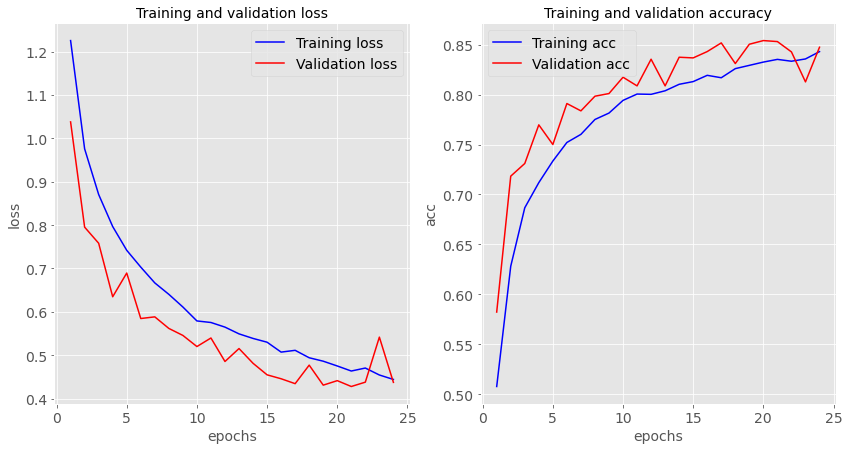

In [228]:
plot_history(history)

In [229]:
predictions = model.predict(val_data_gen)
predictions = np.argmax(predictions, axis=1)

accuracy = 84.73%


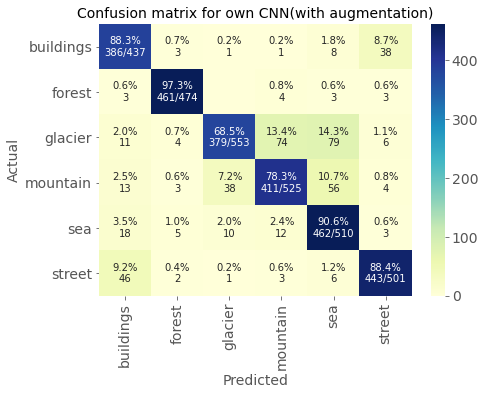

              precision    recall  f1-score   support

   buildings       0.81      0.88      0.84       437
      forest       0.96      0.97      0.97       474
     glacier       0.88      0.69      0.77       553
    mountain       0.81      0.78      0.80       525
         sea       0.75      0.91      0.82       510
      street       0.89      0.88      0.89       501

    accuracy                           0.85      3000
   macro avg       0.85      0.85      0.85      3000
weighted avg       0.85      0.85      0.85      3000



In [230]:
print(f'accuracy = {np.round(accuracy_score(y_valid, predictions),4)*100}%')
plot_confusion_matrix('Confusion matrix for own CNN(with augmentation)', y_valid, predictions, class_names)
print(classification_report(y_valid, predictions, target_names=list(val_data_gen.class_indices.keys())))

In [231]:
plot_data = show_top_images(model, val_data_gen)

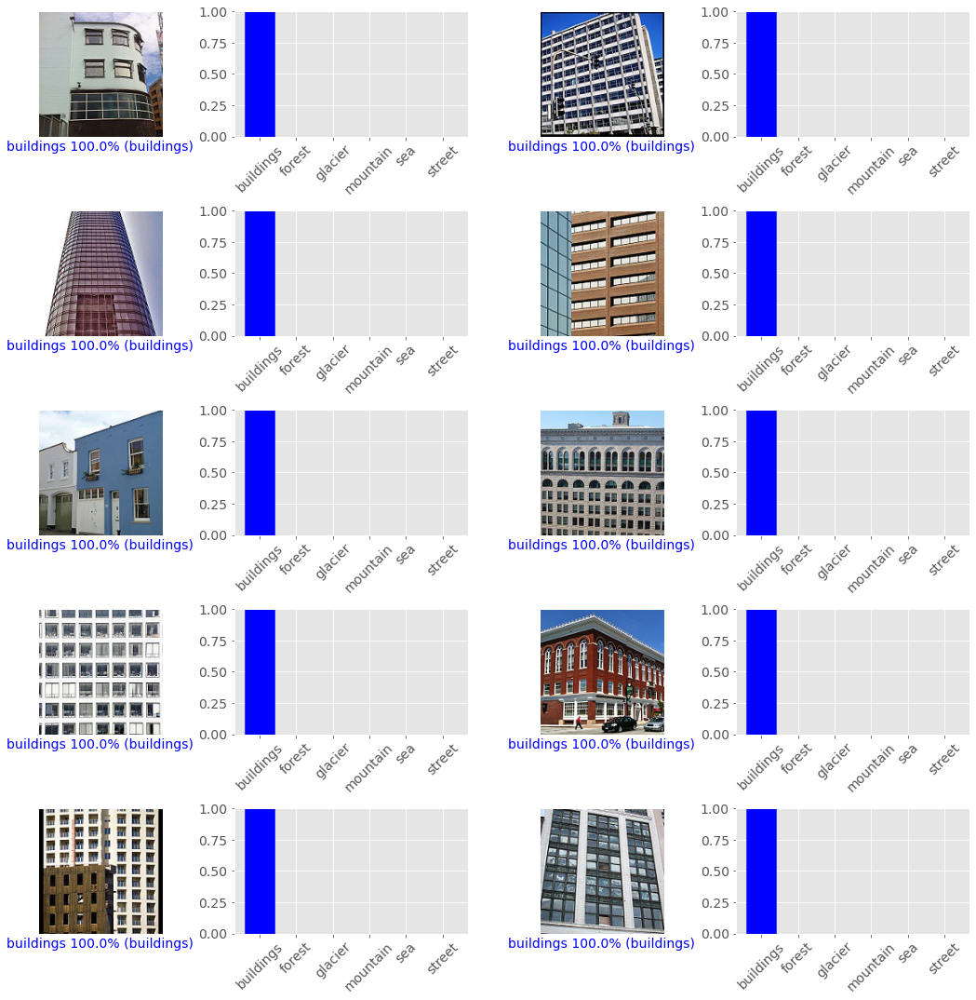

In [232]:
# Color correct predictions in blue, incorrect predictions in red
num_img=10
num_rows = num_img//2
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(15, 3*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_image(i, top_data, pred_best=True, num_img=num_img)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_value_array(i, top_data, pred_best=True, num_img=num_img)
plt.tight_layout(pad=1) 

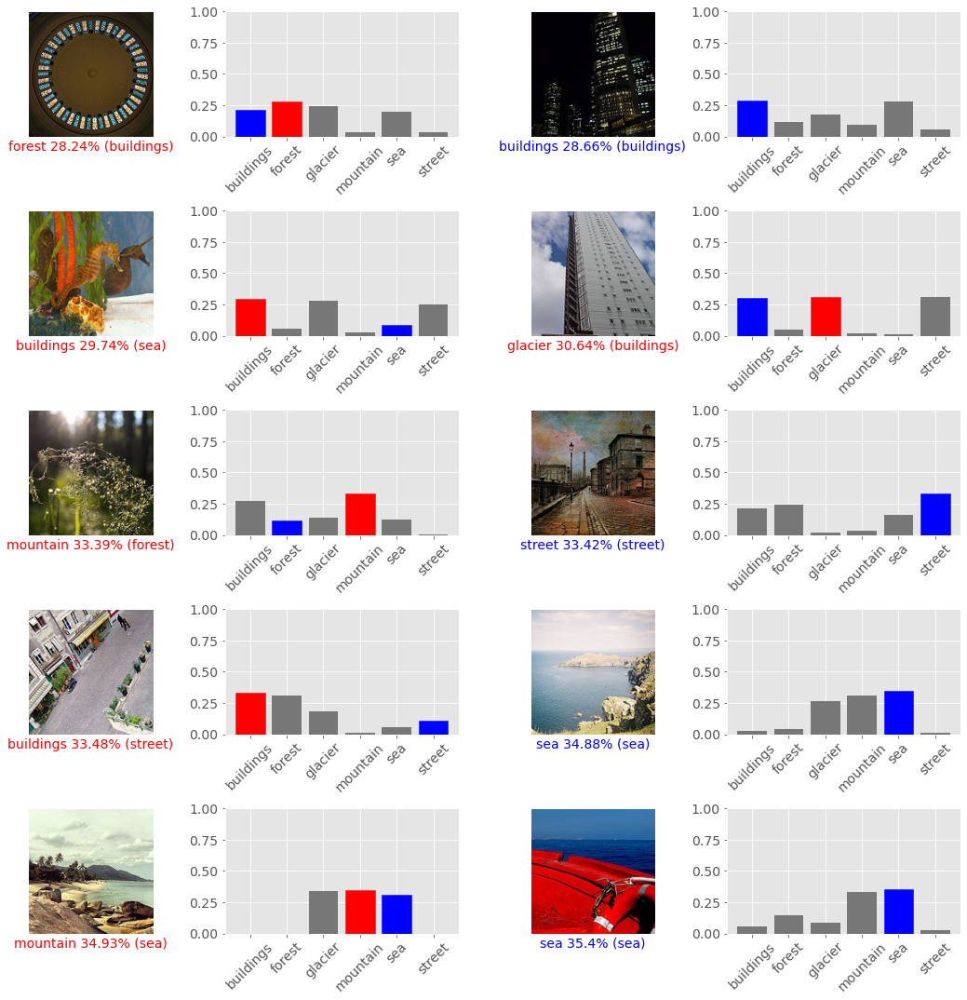

In [233]:
# Color correct predictions in blue, incorrect predictions in red
num_img=10
num_rows = num_img//2
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(15, 3*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_image(i, top_data, pred_best=False, num_img=num_img)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_value_array(i, top_data, pred_best=False, num_img=num_img)
plt.tight_layout(pad=1) 

# Transfer learning:

## MobileNet:

In [234]:
IMG_SHAPE = 224

In [235]:
image_gen_train = ImageDataGenerator(rescale=1./255)

train_data_gen = image_gen_train.flow_from_directory(
    batch_size=BATCH_SIZE,
    directory=train_dir,
    shuffle=True,
    target_size=(IMG_SHAPE,IMG_SHAPE)
    )

image_gen_val = ImageDataGenerator(rescale=1./255)

val_data_gen = image_gen_val.flow_from_directory(
    batch_size=BATCH_SIZE,
    directory=validation_dir,
    shuffle=False,
    target_size=(IMG_SHAPE, IMG_SHAPE)
    )

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [236]:
URL = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/2"
feature_extractor = hub.KerasLayer(URL, input_shape=(IMG_SHAPE, IMG_SHAPE,3))

In [237]:
feature_extractor.trainable = False

In [238]:
model = tf.keras.Sequential([
  feature_extractor,
  Dropout(0.5),
  Dense(6, activation='softmax')
])

model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1280)              2257984   
_________________________________________________________________
dropout_10 (Dropout)         (None, 1280)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 6)                 7686      
Total params: 2,265,670
Trainable params: 7,686
Non-trainable params: 2,257,984
_________________________________________________________________


In [239]:
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )    

history = model.fit(
    train_data_gen,
    epochs=10,
    validation_data=val_data_gen,
    verbose = 1,
    callbacks=[EarlyStopping(
            monitor='val_loss', 
            patience=3)]
)

Epoch 1/10
220/220 [==============================] - 621s 3s/step - loss: 0.8245 - accuracy: 0.6853 - val_loss: 0.2591 - val_accuracy: 0.9087
Epoch 2/10
220/220 [==============================] - 617s 3s/step - loss: 0.3076 - accuracy: 0.8838 - val_loss: 0.2410 - val_accuracy: 0.9143
Epoch 3/10
220/220 [==============================] - 622s 3s/step - loss: 0.2751 - accuracy: 0.8961 - val_loss: 0.2358 - val_accuracy: 0.9140
Epoch 4/10
220/220 [==============================] - 687s 3s/step - loss: 0.2684 - accuracy: 0.9005 - val_loss: 0.2285 - val_accuracy: 0.9200
Epoch 5/10
220/220 [==============================] - 661s 3s/step - loss: 0.2554 - accuracy: 0.9049 - val_loss: 0.2283 - val_accuracy: 0.9147
Epoch 6/10
220/220 [==============================] - 635s 3s/step - loss: 0.2478 - accuracy: 0.9101 - val_loss: 0.2309 - val_accuracy: 0.9123
Epoch 7/10
220/220 [==============================] - 667s 3s/step - loss: 0.2522 - accuracy: 0.9090 - val_loss: 0.2306 - val_accuracy: 0.9180

In [240]:
_, acc = model.evaluate(x=val_data_gen, batch_size=len(val_data_gen), verbose=0)
print(f'Accarucy = {np.round((acc * 100.0), 3)}%')

Accarucy = 91.833%


Learning curves:


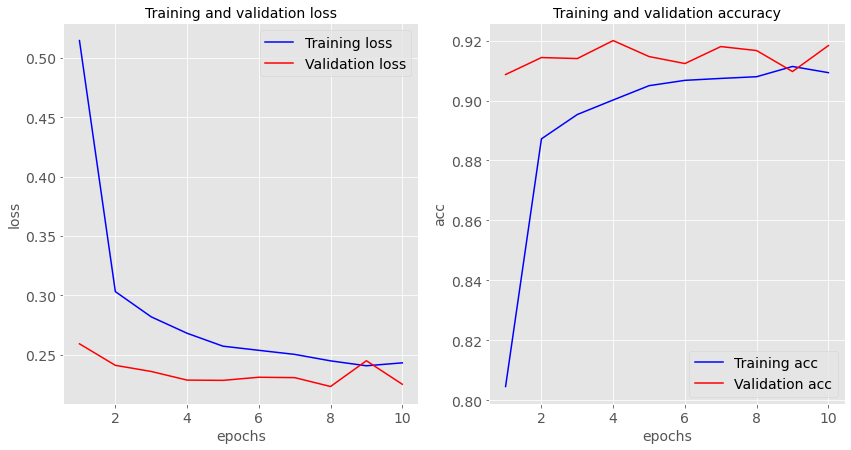

In [241]:
plot_history(history)

In [242]:
predictions = model.predict(val_data_gen)
predictions = np.argmax(predictions, axis=1)

accuracy = 91.83%


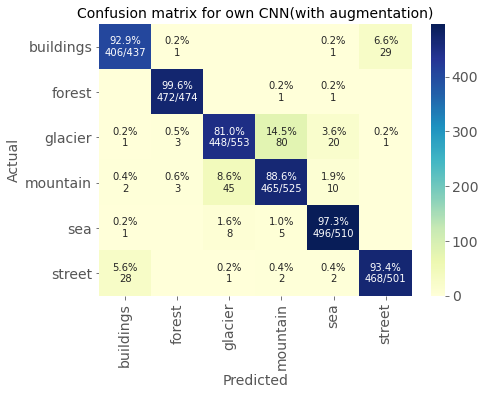

              precision    recall  f1-score   support

   buildings       0.93      0.93      0.93       437
      forest       0.99      1.00      0.99       474
     glacier       0.89      0.81      0.85       553
    mountain       0.84      0.89      0.86       525
         sea       0.94      0.97      0.95       510
      street       0.94      0.93      0.94       501

    accuracy                           0.92      3000
   macro avg       0.92      0.92      0.92      3000
weighted avg       0.92      0.92      0.92      3000



In [243]:
print(f'accuracy = {np.round(accuracy_score(y_valid, predictions),4)*100}%')
plot_confusion_matrix('Confusion matrix for own CNN(with augmentation)', y_valid, predictions, class_names)
print(classification_report(y_valid, predictions, target_names=list(val_data_gen.class_indices.keys())))

In [244]:
plot_data = show_top_images(model, val_data_gen)

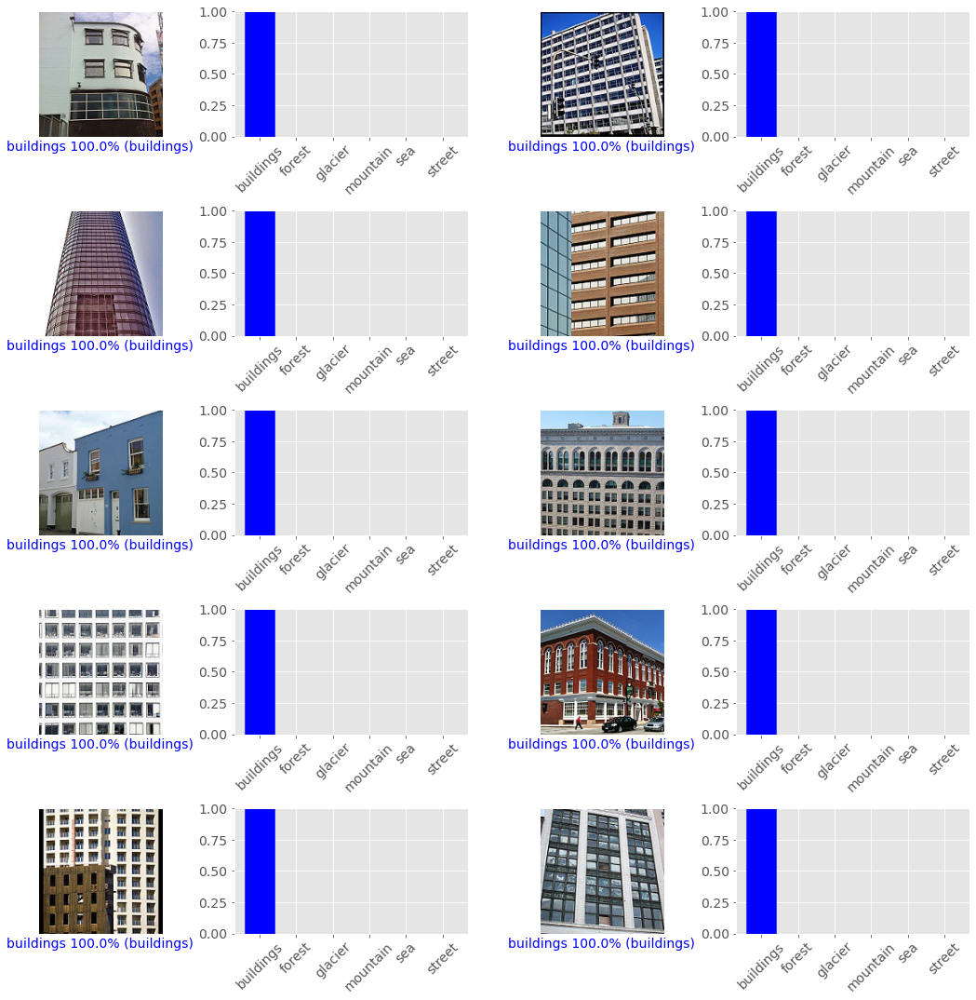

In [245]:
# Color correct predictions in blue, incorrect predictions in red
num_img=10
num_rows = num_img//2
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(15, 3*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_image(i, top_data, pred_best=True, num_img=num_img)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_value_array(i, top_data, pred_best=True, num_img=num_img)
plt.tight_layout(pad=1) 

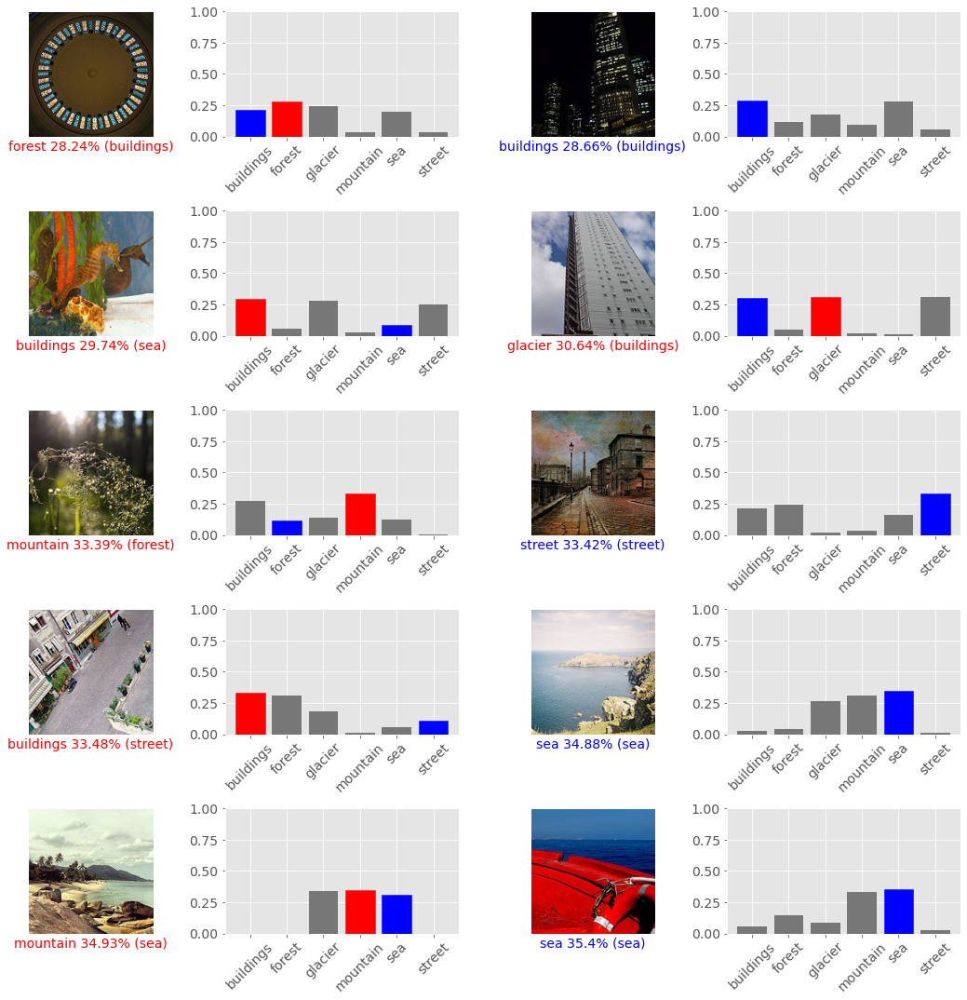

In [246]:
# Color correct predictions in blue, incorrect predictions in red
num_img=10
num_rows = num_img//2
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(15, 3*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_image(i, top_data, pred_best=False, num_img=num_img)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_value_array(i, top_data, pred_best=False, num_img=num_img)
plt.tight_layout(pad=1) 

## Resnet:

In [247]:
URL = "https://tfhub.dev/tensorflow/resnet_50/classification/1"
feature_extractor = hub.KerasLayer(URL, input_shape=(IMG_SHAPE, IMG_SHAPE,3))

In [248]:
feature_extractor.trainable = False

In [249]:
model = tf.keras.Sequential([
  feature_extractor,
  Dropout(0.5),
  Dense(6, activation='softmax')
])

model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer_1 (KerasLayer)   (None, 1001)              25612201  
_________________________________________________________________
dropout_11 (Dropout)         (None, 1001)              0         
_________________________________________________________________
dense_5 (Dense)              (None, 6)                 6012      
Total params: 25,618,213
Trainable params: 6,012
Non-trainable params: 25,612,201
_________________________________________________________________


In [250]:
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )    

history = model.fit(
    train_data_gen,
    epochs=5,
    validation_data=val_data_gen,
    verbose = 1,
    callbacks=[EarlyStopping(
            monitor='val_loss', 
            patience=3)]
)

Epoch 1/5
220/220 [==============================] - 2411s 11s/step - loss: 1.7434 - accuracy: 0.4706 - val_loss: 1.6270 - val_accuracy: 0.7240
Epoch 2/5
220/220 [==============================] - 2490s 11s/step - loss: 1.5971 - accuracy: 0.6385 - val_loss: 1.4931 - val_accuracy: 0.7437
Epoch 3/5
220/220 [==============================] - 2272s 10s/step - loss: 1.4858 - accuracy: 0.6580 - val_loss: 1.3812 - val_accuracy: 0.7473
Epoch 4/5
220/220 [==============================] - 2262s 10s/step - loss: 1.3919 - accuracy: 0.6573 - val_loss: 1.2847 - val_accuracy: 0.7547
Epoch 5/5
220/220 [==============================] - 2210s 10s/step - loss: 1.3131 - accuracy: 0.6622 - val_loss: 1.2017 - val_accuracy: 0.7593


In [251]:
_, acc = model.evaluate(x=val_data_gen, batch_size=len(val_data_gen), verbose=0)
print(f'Accarucy = {np.round((acc * 100.0), 3)}%')

Accarucy = 75.933%


Learning curves:


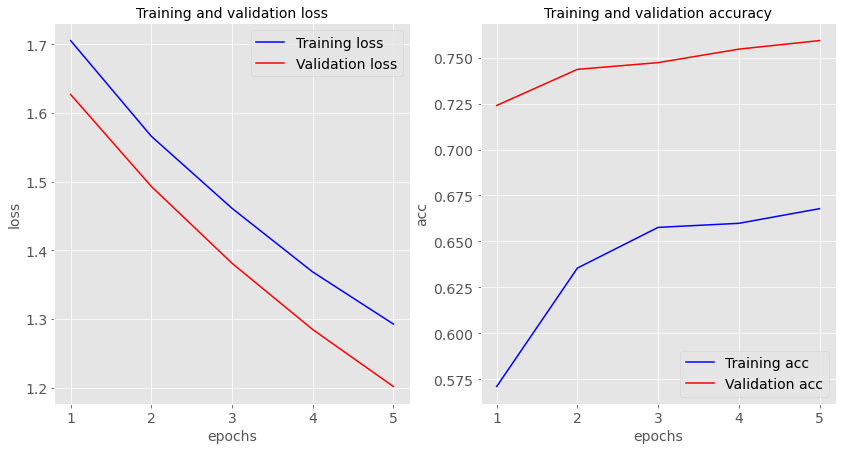

In [252]:
plot_history(history)

In [253]:
predictions = model.predict(val_data_gen)
predictions = np.argmax(predictions, axis=1)

accuracy = 75.92999999999999%


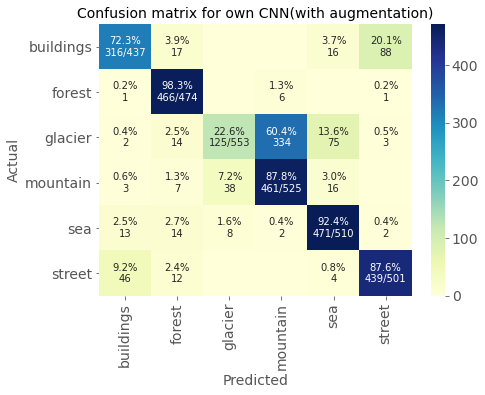

              precision    recall  f1-score   support

   buildings       0.83      0.72      0.77       437
      forest       0.88      0.98      0.93       474
     glacier       0.73      0.23      0.35       553
    mountain       0.57      0.88      0.69       525
         sea       0.81      0.92      0.86       510
      street       0.82      0.88      0.85       501

    accuracy                           0.76      3000
   macro avg       0.77      0.77      0.74      3000
weighted avg       0.77      0.76      0.73      3000



In [254]:
print(f'accuracy = {np.round(accuracy_score(y_valid, predictions),4)*100}%')
plot_confusion_matrix('Confusion matrix for own CNN(with augmentation)', y_valid, predictions, class_names)
print(classification_report(y_valid, predictions, target_names=list(val_data_gen.class_indices.keys())))

In [259]:
plot_data = show_top_images(model, val_data_gen)

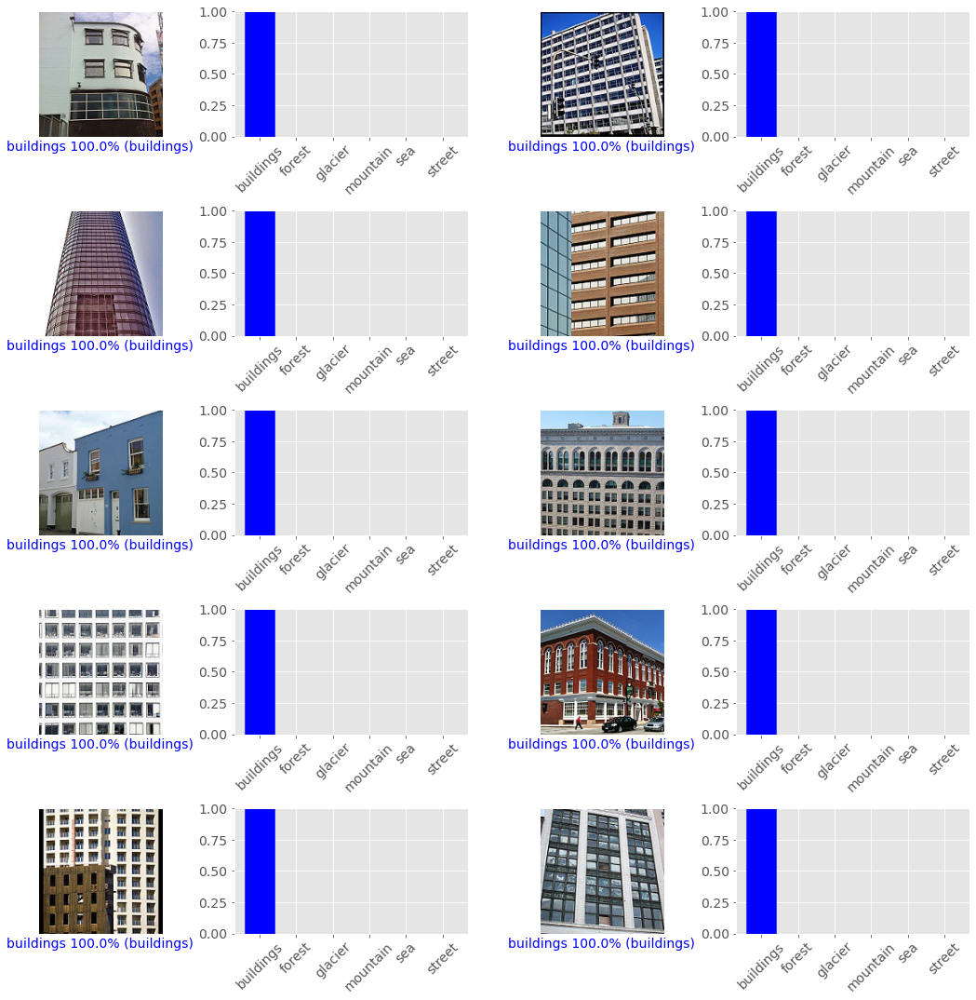

In [260]:
# Color correct predictions in blue, incorrect predictions in red
num_img=10
num_rows = num_img//2
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(15, 3*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_image(i, top_data, pred_best=True, num_img=num_img)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_value_array(i, top_data, pred_best=True, num_img=num_img)
plt.tight_layout(pad=1) 

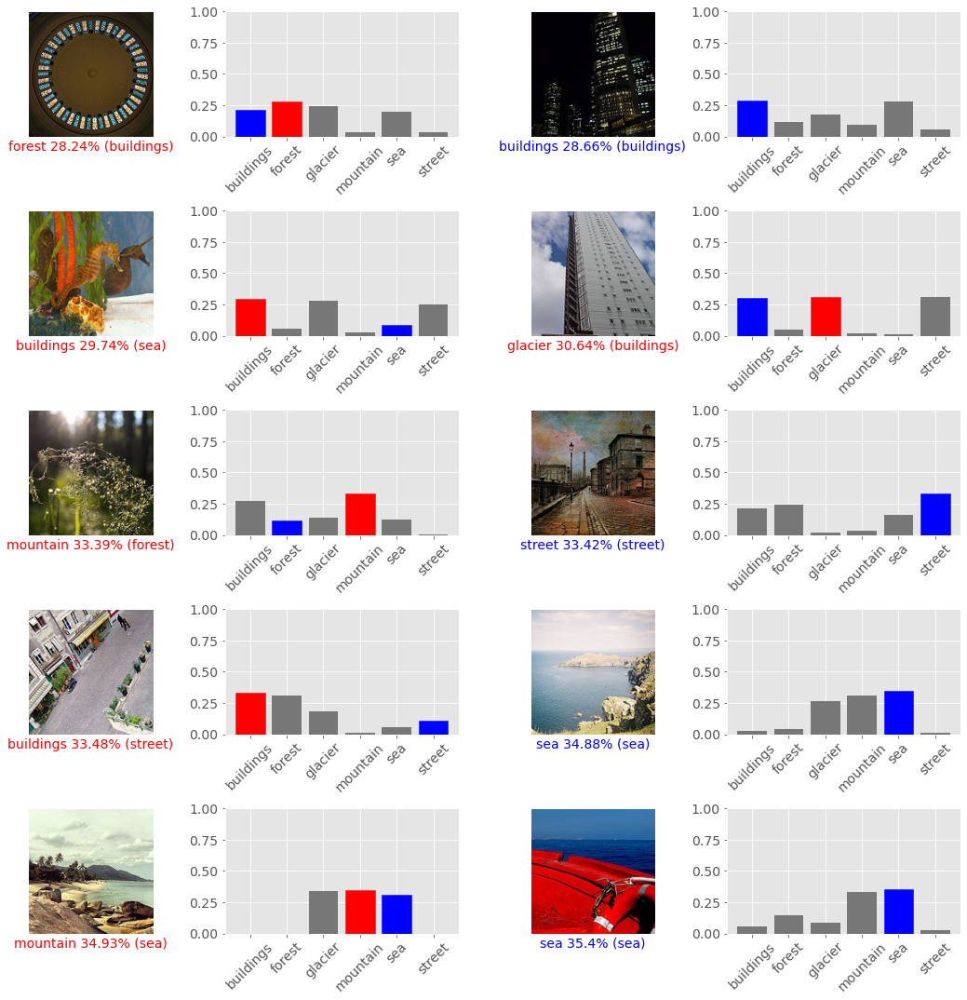

In [262]:
# Color correct predictions in blue, incorrect predictions in red
num_img=10
num_rows = num_img//2
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(15, 3*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_image(i, top_data, pred_best=False, num_img=num_img)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_value_array(i, top_data, pred_best=False, num_img=num_img)
plt.tight_layout(pad=1) 

# Conclusions:

- Classical ML is not very useful aproach when we work with images;
- Convolutional Neural Networks give much more accurate predictions;
- Augmentation is an useful technic sometimes, but in our case it does not give better results. Maybe we should use more complex CNN because of the larger dataset;
- Transfer learning is very useful aproach and in our case it gives the best results - Accuracy = 92%.
- Usually CNN models gave bad prediction in really difficult cases(when it is not obvious even for a human what is there)
- The biggest amount of mistakes were made in prediction of glaciers and mountains labels.
- The least amount of mistakes were made in prediction of forest label.

**Problems:**

- Some images can contain several classes at the same time. We should think not only about multiclass classification, but about multilabel classification as well;
- The data contains mistakes(incorrect class or even not a class at all);
- Some classes are just similar to each other.
